In [2]:
!where python

c:\ProgramData\anaconda3\python.exe
C:\Users\Atharsh\AppData\Local\Programs\Python\Python312\python.exe
C:\Users\Atharsh\AppData\Local\Microsoft\WindowsApps\python.exe


In [1]:
import torch
print("CUDA available:", torch.cuda.is_available())
print("CUDA device name:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU")

CUDA available: True
CUDA device name: NVIDIA GeForce RTX 4050 Laptop GPU


In [1]:
import os
import cv2
import math
import time
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

## Sequential Image Search    

In [3]:
from ImageSearch_Serial import ImageSearch

start = time.perf_counter()
search_results = ImageSearch("103900.jpg")
end = time.perf_counter()
print(f"Sequential Time : {end-start}")
seq_time = end-start

Sequential Time : 64.5103475000069


In [4]:
import time
import os

# Make sure we're importing from the correct files
from ImageSearch_Serial import ImageSearch as ImageSearch_Serial
from ImageSearch_Serial_CUDA import ImageSearch as ImageSearch_CUDA

# Print current working directory to help diagnose path issues
print(f"Current working directory: {os.getcwd()}")

# Sequential version
start = time.perf_counter()
search_results = ImageSearch_Serial("103900.jpg")
end = time.perf_counter()
seq_time = end-start
print(f"Sequential Time: {seq_time:.4f} seconds")

# CUDA version
start = time.perf_counter()
cuda_search_results = ImageSearch_CUDA("103900.jpg")
end = time.perf_counter()
cuda_time = end-start
print(f"CUDA Time: {cuda_time:.4f} seconds")

# Calculate speedup
speedup = seq_time / cuda_time
print(f"Speedup: {speedup:.2f}x")

Current working directory: d:\athu study\SEM 8\PDC\Package\Image-Search-using-Parallel-Computing-master
Sequential Time: 113.8561 seconds
CUDA Time: 85.8656 seconds
Speedup: 1.33x


In [4]:
import time
import os

# Make sure we're importing from the correct files
from ImageSearch_Serial import ImageSearch as ImageSearch_Serial

# Print current working directory to help diagnose path issues
print(f"Current working directory: {os.getcwd()}")

# Sequential version
start = time.perf_counter()
search_results = ImageSearch_Serial("103900.jpg")
end = time.perf_counter()
seq_time = end-start
print(f"Sequential Time: {seq_time:.4f} seconds")


Current working directory: d:\athu study\SEM 8\PDC\Package\Image-Search-using-Parallel-Computing-master
Sequential Time: 58.1187 seconds


In [3]:
import time
import os


from ImageSearch_Serial_CUDA import ImageSearch as ImageSearch_CUDA  # Use the new file we created


# CUDA version
start = time.perf_counter()
cuda_search_results = ImageSearch_CUDA("103900.jpg")
end = time.perf_counter()
cuda_time = end-start
print(f"CUDA Time: {cuda_time:.4f} seconds")

CUDA Time: 79.1836 seconds


In [5]:
for sr in search_results[:20]:
    print(sr)

('103100.jpg', 0.0)
('103900.jpg', 0.0)
('103101.jpg', 34602.56313)
('103901.jpg', 34602.56313)
('103102.jpg', 91526.37182)
('103902.jpg', 91526.37182)
('103401.jpg', 106065.13823)
('101701.jpg', 107526.2745)
('101700.jpg', 117563.34775)
('103600.jpg', 118821.70048)
('106903.jpg', 124138.2109)
('103700.jpg', 124253.75799)
('103702.jpg', 134591.39908)
('103601.jpg', 137469.60003)
('107000.jpg', 138750.90733)
('104101.jpg', 146400.09832)
('106901.jpg', 148350.3318)
('103400.jpg', 148560.00655)
('107501.jpg', 150639.61768)
('101901.jpg', 151135.0917)


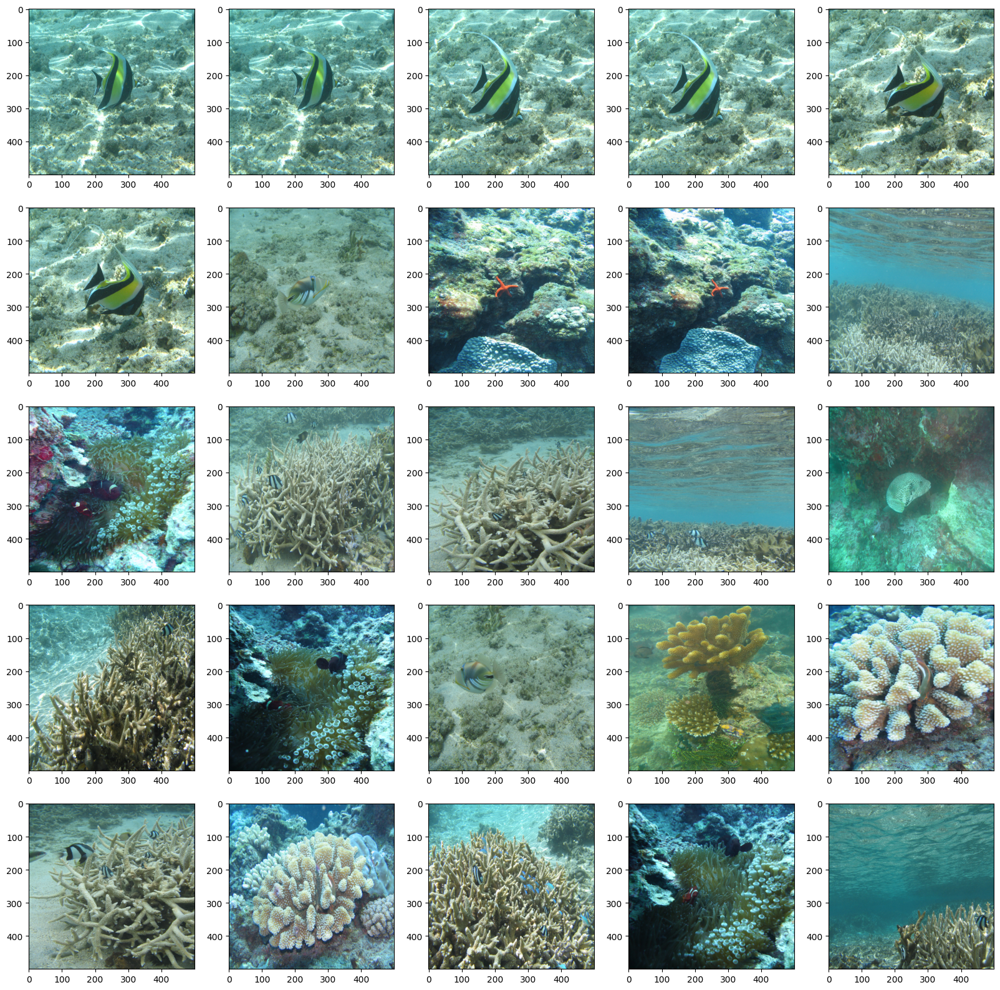

In [6]:
def getImg(img):
    image_db_path = "Image_Database/"
    image = cv2.imread(image_db_path+img)
    image = cv2.resize(image, (500,500))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

plt.figure(figsize=(20,20)) 

for i in range(25):
    plt.subplot(5,5,i+1)
    plt.imshow(getImg(search_results[i][0]))

plt.show()

#    

# Parallel Image Search

In [2]:
from ImageSearch_parallel import ImageSearch

start = time.perf_counter()
search_results = ImageSearch("103900.jpg")
end = time.perf_counter()
print(f"Parallel Time : {end-start}")
prl_time = end-start

Parallel Time : 21.64306769997347


In [7]:
import time
import os

# Make sure we're importing from the correct files
from ImageSearch_parallel import ImageSearch as ImageSearch_Serial
from ImageSearch_parallel_CUDA import ImageSearch as ImageSearch_CUDA

# Print current working directory to help diagnose path issues
print(f"Current working directory: {os.getcwd()}")

# Sequential version
start = time.perf_counter()
search_results = ImageSearch_Serial("103900.jpg")
end = time.perf_counter()
seq_time = end-start
print(f"parallel Time: {seq_time:.4f} seconds")

# CUDA version
start = time.perf_counter()
cuda_search_results = ImageSearch_CUDA("103900.jpg")
end = time.perf_counter()
cuda_time = end-start
print(f"parallel CUDA Time: {cuda_time:.4f} seconds")

# Calculate speedup
speedup = seq_time / cuda_time
print(f"Speedup: {speedup:.2f}x")

Current working directory: d:\athu study\SEM 8\PDC\Package\Image-Search-using-Parallel-Computing-master
parallel Time: 23.9727 seconds
parallel CUDA Time: 22.7746 seconds
Speedup: 1.05x


In [8]:
for sr in search_results[:20]:
    print(sr)

('103900.jpg', 0.0)
('103100.jpg', 0.0)
('103901.jpg', 34602.56313)
('103101.jpg', 34602.56313)
('103902.jpg', 91526.37182)
('103102.jpg', 91526.37182)
('103401.jpg', 106065.13823)
('101701.jpg', 107526.2745)
('101700.jpg', 117563.34775)
('103600.jpg', 118821.70048)
('106903.jpg', 124138.2109)
('103700.jpg', 124253.75799)
('103702.jpg', 134591.39908)
('103601.jpg', 137469.60003)
('107000.jpg', 138750.90733)
('104101.jpg', 146400.09832)
('106901.jpg', 148350.3318)
('103400.jpg', 148560.00655)
('107501.jpg', 150639.61768)
('101901.jpg', 151135.0917)


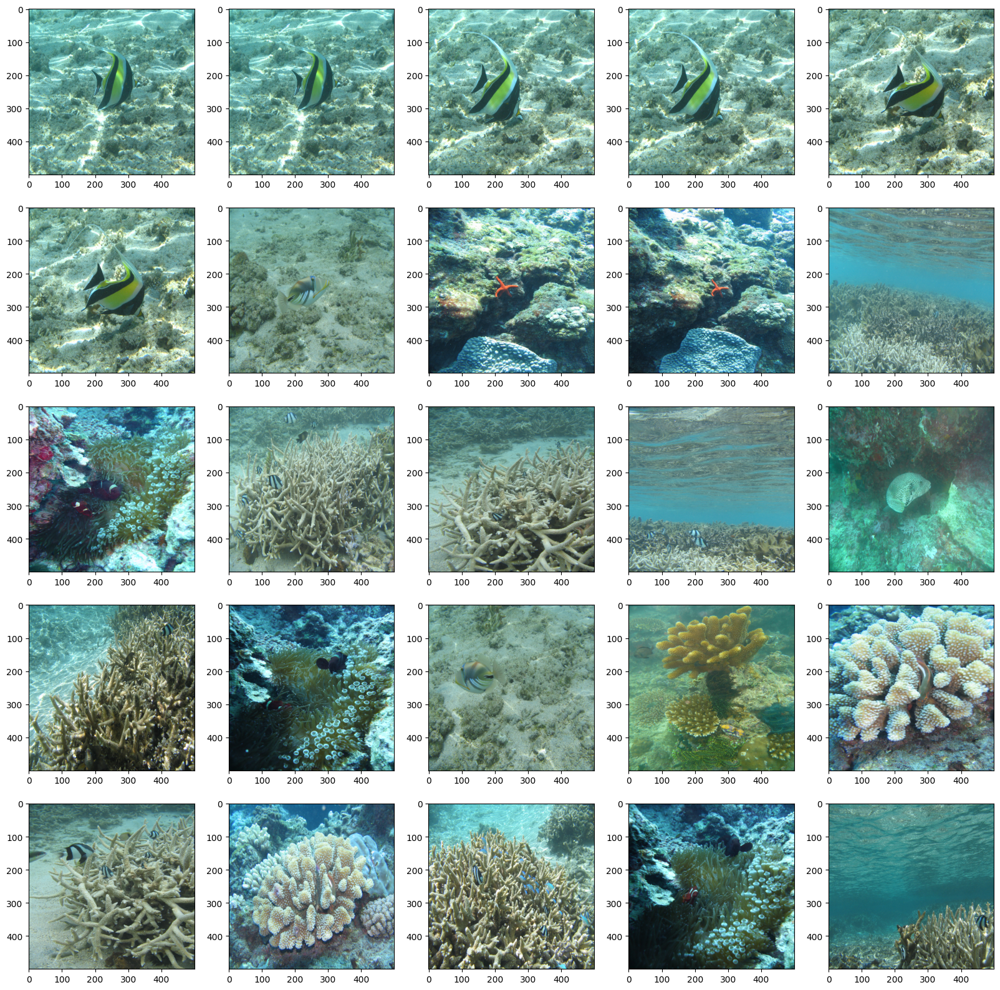

In [9]:
def getImg(img):
    image_db_path = "Image_Database/"
    image = cv2.imread(image_db_path+img)
    image = cv2.resize(image, (500,500))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image
    print(img)

plt.figure(figsize=(20,20)) 

for i in range(25):
    plt.subplot(5,5,i+1)
    plt.imshow(getImg(search_results[i][0]))

plt.show()

#  